<a href="https://colab.research.google.com/github/anjanpa/CIFAR_MULTI_CLASS_CLASSIFICATION/blob/master/CIFAR_10_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# PROBLEM STATEMENT

* Given 60000 32x32 colour images in 10 classes, with 6000 images per class, build a multiclass classification model
*There are 50000 training images and 10000 test images.

# Data 
Data is taken from https://www.tensorflow.org/datasets/catalog/cifar10

# Features 
The images are labelled with one of 10 mutually exclusive classes: airplane, automobile (but not truck or pickup truck), bird, cat, deer, dog, frog, horse, ship, and truck (but not pickup truck).

# Evaluation
 The  macro-averaged F1 score will be the evaluation metrics for the model.


#PREPARING TOOLS

In [1]:
import tensorflow as tf
import pandas as pd
import numpy as np
import sklearn 
%matplotlib inline
import matplotlib.pyplot as plt

In [3]:
plt.style.available

['Solarize_Light2',
 '_classic_test_patch',
 '_mpl-gallery',
 '_mpl-gallery-nogrid',
 'bmh',
 'classic',
 'dark_background',
 'fast',
 'fivethirtyeight',
 'ggplot',
 'grayscale',
 'seaborn-v0_8',
 'seaborn-v0_8-bright',
 'seaborn-v0_8-colorblind',
 'seaborn-v0_8-dark',
 'seaborn-v0_8-dark-palette',
 'seaborn-v0_8-darkgrid',
 'seaborn-v0_8-deep',
 'seaborn-v0_8-muted',
 'seaborn-v0_8-notebook',
 'seaborn-v0_8-paper',
 'seaborn-v0_8-pastel',
 'seaborn-v0_8-poster',
 'seaborn-v0_8-talk',
 'seaborn-v0_8-ticks',
 'seaborn-v0_8-white',
 'seaborn-v0_8-whitegrid',
 'tableau-colorblind10']

In [4]:
plt.style=('seaborn-v0_8-white')

In [5]:
# import data
from tensorflow import keras
(X_train, y_train), (X_test, y_test) = keras.datasets.cifar10.load_data()

170498071/170498071 [==============================] - 2s 0us/step


In [6]:
X_train.shape,y_train.shape,X_test.shape,y_test.shape

((50000, 32, 32, 3), (50000, 1), (10000, 32, 32, 3), (10000, 1))

# EXPLORING DATA

## a. Image Specs

In [7]:
X_train[0][0]

array([[ 59,  62,  63],
       [ 43,  46,  45],
       [ 50,  48,  43],
       [ 68,  54,  42],
       [ 98,  73,  52],
       [119,  91,  63],
       [139, 107,  75],
       [145, 110,  80],
       [149, 117,  89],
       [149, 120,  93],
       [131, 103,  77],
       [125,  99,  76],
       [142, 115,  91],
       [144, 112,  86],
       [137, 105,  79],
       [129,  97,  71],
       [137, 106,  79],
       [134, 106,  76],
       [124,  97,  64],
       [139, 113,  78],
       [139, 112,  75],
       [133, 105,  69],
       [136, 105,  74],
       [139, 108,  77],
       [152, 120,  89],
       [163, 131, 100],
       [168, 136, 108],
       [159, 129, 102],
       [158, 130, 104],
       [158, 132, 108],
       [152, 125, 102],
       [148, 124, 103]], dtype=uint8)

In [8]:
y_train[0]

array([6], dtype=uint8)

In [9]:
# Labels and description
classes=pd.DataFrame({"Label":[0,1,2,3,4,5,6,7,8,9],
                      "Description":["airplane","automobile","bird","cat","deer","dog","frog","horse","ship","truck"]})


In [10]:
classes

,Label,Description
0,0,airplane
1,1,automobile
2,2,bird
3,3,cat
4,4,deer
5,5,dog
6,6,frog
7,7,horse
8,8,ship
9,9,truck


In [11]:
def display_variety(y):
  data=pd.Series(y.reshape(len(y))).value_counts()
  data.plot(kind="bar",
            cmap="summer");

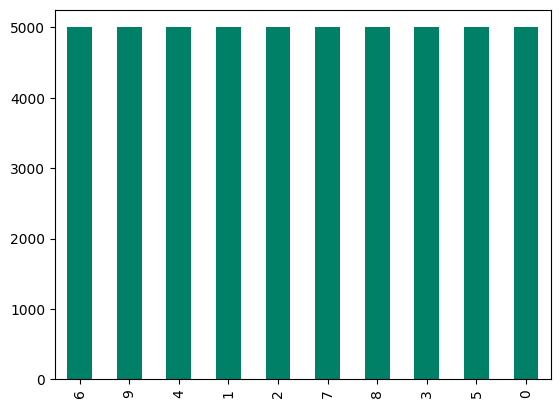

In [12]:
display_variety(y_train)

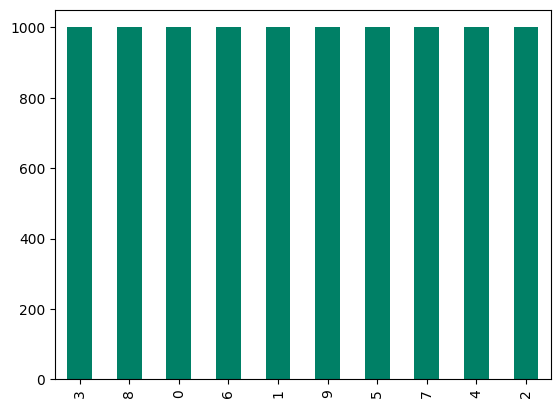

In [13]:
display_variety(y_test)

In [14]:
labels=classes["Description"]
labels

0      airplane
1    automobile
2          bird
3           cat
4          deer
5           dog
6          frog
7         horse
8          ship
9         truck
Name: Description, dtype: object

In [15]:
cifar_class=np.array(labels)


In [16]:
# Turn every label into a boolean array
boolean_labels = [cifar_class[label] == np.array(cifar_class) for label in y_train]
boolean_labels[:2]

[array([False, False, False, False, False, False,  True, False, False,
        False]),
 array([False, False, False, False, False, False, False, False, False,
         True])]

In [17]:
len(boolean_labels)

50000

In [18]:
y_train[5]

array([1], dtype=uint8)

In [19]:
def show_image(X,y): 
  plt.imshow(X)
  plt.title(np.array(labels)[y])
  plt.axis("off")



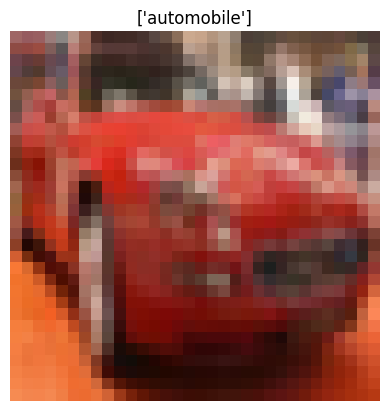

In [20]:
show_image(X_train[5],y_train[5])

##b. Splitting into training and validation sets

In [21]:
X=X_train
y=boolean_labels
np.random.seed(42)
from sklearn.model_selection import train_test_split
X_tr,X_val,y_tr,y_val=train_test_split(X,y,
                                       test_size=0.2,
                                       shuffle=True,
                                       random_state=42)

In [22]:
X_tr.shape,X_val.shape

((40000, 32, 32, 3), (10000, 32, 32, 3))

In [23]:
y_tr.shape,y_val.shape

AttributeError: ignored

# PREPROCESSING IMAGE

##a.Converting to tensors and desired size

In [24]:
X_train.dtype,type(X_train)

(dtype('uint8'), numpy.ndarray)

In [25]:
tf.constant(X_train)[0]

<tf.Tensor: shape=(32, 32, 3), dtype=uint8, numpy=
array([[[ 59,  62,  63],
        [ 43,  46,  45],
        [ 50,  48,  43],
        ...,
        [158, 132, 108],
        [152, 125, 102],
        [148, 124, 103]],

       [[ 16,  20,  20],
        [  0,   0,   0],
        [ 18,   8,   0],
        ...,
        [123,  88,  55],
        [119,  83,  50],
        [122,  87,  57]],

       [[ 25,  24,  21],
        [ 16,   7,   0],
        [ 49,  27,   8],
        ...,
        [118,  84,  50],
        [120,  84,  50],
        [109,  73,  42]],

       ...,

       [[208, 170,  96],
        [201, 153,  34],
        [198, 161,  26],
        ...,
        [160, 133,  70],
        [ 56,  31,   7],
        [ 53,  34,  20]],

       [[180, 139,  96],
        [173, 123,  42],
        [186, 144,  30],
        ...,
        [184, 148,  94],
        [ 97,  62,  34],
        [ 83,  53,  34]],

       [[177, 144, 116],
        [168, 129,  94],
        [179, 142,  87],
        ...,
        [216, 184, 140]

In [26]:
#Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image, img_size=IMG_SIZE):
  """
  Takes an image and turns the image into a Tensor.
  """
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

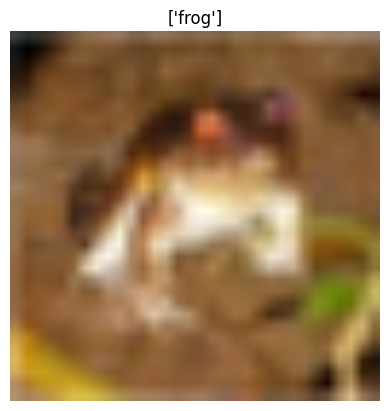

In [27]:
show_image(process_image(X_train[0]),y_train[0])


##b.Turning data to batches

In [28]:
def get_image_label(image, label):
  """
  Takes an image  and the assosciated label,
  processes the image and returns a typle of (image, label).
  """
  image = process_image(image)
  return image, label

In [29]:
len(y_train) ,y_train[:10],y_train.dtype

(50000,
 array([[6],
        [9],
        [9],
        [4],
        [1],
        [1],
        [2],
        [7],
        [8],
        [3]], dtype=uint8),
 dtype('uint8'))

In [30]:
# Define the batch size, 32 is a good default
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  
  # If the data if a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    # If the data is a training dataset, we shuffle it
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                              tf.constant(y))) # labels
    
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [31]:
test=tf.data.Dataset.from_tensor_slices((tf.constant(X_train),tf.constant(y_train)))


In [32]:
test.map(get_image_label)

<_MapDataset element_spec=(TensorSpec(shape=(224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(1,), dtype=tf.uint8, name=None))>

In [ ]:
for i in range(2):
  print(test.as_numpy_iterator().next())

(array([[[ 59,  62,  63],
        [ 43,  46,  45],
        [ 50,  48,  43],
        ...,
        [158, 132, 108],
        [152, 125, 102],
        [148, 124, 103]],

       [[ 16,  20,  20],
        [  0,   0,   0],
        [ 18,   8,   0],
        ...,
        [123,  88,  55],
        [119,  83,  50],
        [122,  87,  57]],

       [[ 25,  24,  21],
        [ 16,   7,   0],
        [ 49,  27,   8],
        ...,
        [118,  84,  50],
        [120,  84,  50],
        [109,  73,  42]],

       ...,

       [[208, 170,  96],
        [201, 153,  34],
        [198, 161,  26],
        ...,
        [160, 133,  70],
        [ 56,  31,   7],
        [ 53,  34,  20]],

       [[180, 139,  96],
        [173, 123,  42],
        [186, 144,  30],
        ...,
        [184, 148,  94],
        [ 97,  62,  34],
        [ 83,  53,  34]],

       [[177, 144, 116],
        [168, 129,  94],
        [179, 142,  87],
        ...,
        [216, 184, 140],
        [151, 118,  84],
        [123,  92,  72]

### TESTING ON DUMMY IMAGES

In [ ]:
test2=tf.data.Dataset.from_tensor_slices((tf.constant(filenames),tf.constant(boolean_labels)))

In [ ]:
list(test2.as_numpy_iterator())[0]

(b'/content/drive/MyDrive/Dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 array([ True, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, Fa

In [ ]:
for i in range(2):
  print(test2.as_numpy_iterator().next())

(b'/content/drive/MyDrive/Dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg', array([ True, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       F

### FINISHED TESTING ON DUMMY IMAGES

### Preprocessing actual data

In [33]:
## Creating training and test data batches
train_data=create_data_batches(X_tr,y_tr)
val_data=create_data_batches(X_val,y_val,valid_data=True)

Creating training data batches...
Creating validation data batches...


In [34]:
## Checking attributes of our data
train_data.element_spec,val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 10), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 10), dtype=tf.bool, name=None)))

# VIUSALIZING DATA BATCHES

In [35]:
cifar_labels=np.array(labels)


In [36]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays 25 images from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5,5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(cifar_labels[labels[i]][0])
    # Turn gird lines off
    plt.axis("off")

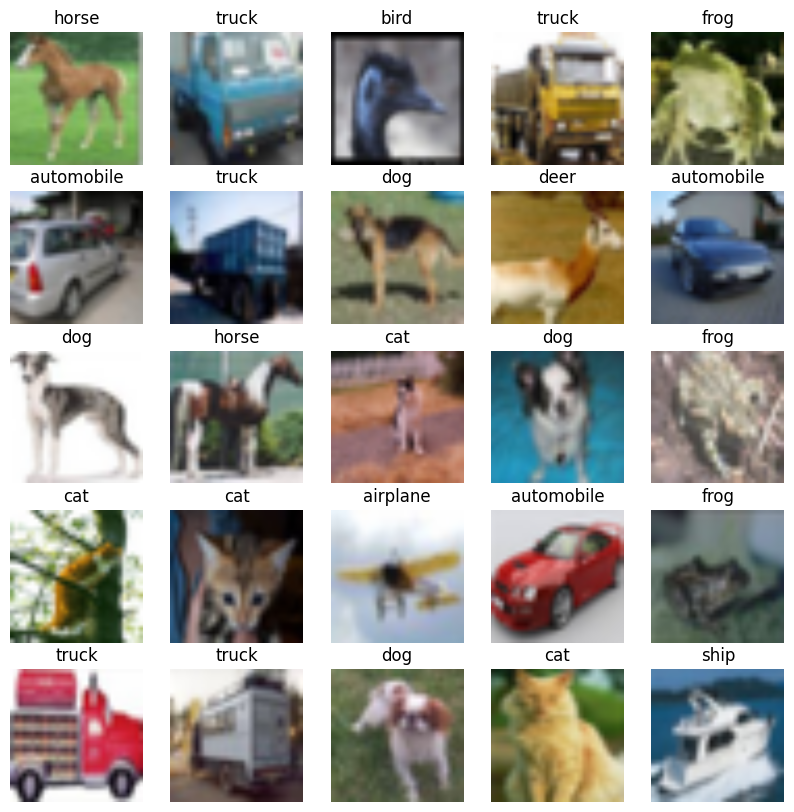

In [37]:
# Visualize training images from the training data batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

#MODELING

In [38]:
cifar_labels

array(['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog',
       'horse', 'ship', 'truck'], dtype=object)

## a.mobilenetv2

In [39]:
import tensorflow_hub as hub

In [40]:
#Defining input shape
INPUT_SHAPE=[None,IMG_SIZE,IMG_SIZE,3]

#Setup output shape of our model
OUTPUT_SHAPE=len(cifar_labels)

#Setup model URL from Tensorflow Hub
MODEL_URL="https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [97]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE, 
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), # Our model wants to reduce this (how wrong its guesses are)
      optimizer=tf.keras.optimizers.Adam(), # A friend telling our model how to improve its guesses
      metrics=["accuracy"] # We'd like this to go up
  )

  # Build the model
  model.build(INPUT_SHAPE) # Let the model know what kind of inputs it'll be getting
  
  return model

In [ ]:
## create a model and check its details
model1=create_model(INPUT_SHAPE,OUTPUT_SHAPE,MODEL_URL)
model1.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_10 (KerasLayer)  (None, 1001)             5432713   
                                                                 
 dense_13 (Dense)            (None, 10)                10020     
                                                                 
Total params: 5,442,733
Trainable params: 10,020
Non-trainable params: 5,432,713
_________________________________________________________________


### a.1  Creating callbacks

In [41]:
## Tensorboard
# load tensorboard notebook extension
%load_ext tensorboard


import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("/content/drive/MyDrive/Cifar10/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [42]:
# Create early stopping (once our model stops improving, stop training)
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3) # stops after 3 rounds of no improvements

In [43]:
# How many rounds should we get the model to look through the data?
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [52]:
# Build a function to train and return a trained model
def train_model(train_data,val_data):
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1, # check validation metrics every epoch
            callbacks=[tensorboard, early_stopping])
  
  return model

###a.2 Fitting the model

In [ ]:
model1=train_model()


save_model(model1,"Cifar10Adam")

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
1250/1250 [==============================] - 93s 64ms/step - loss: 0.5461 - accuracy: 0.8170 - val_loss: 0.5468 - val_accuracy: 0.8234
Epoch 2/100
1250/1250 [==============================] - 71s 57ms/step - loss: 0.4221 - accuracy: 0.8580 - val_loss: 0.4440 - val_accuracy: 0.8489
Epoch 3/100
1250/1250 [==============================] - 78s 63ms/step - loss: 0.4018 - accuracy: 0.8657 - val_loss: 0.4743 - val_accuracy: 0.8463
Epoch 4/100
1250/1250 [==============================] - 78s 63ms/step - loss: 0.3931 - accuracy: 0.8676 - val_loss: 0.4544 - val_accuracy: 0.8511
Epoch 5/100
1250/1250 [==============================] - 78s 62ms/step - loss: 0.3830 - accuracy: 0.8715 - val_loss: 0.4368 - val_accuracy: 0.8578
Epoch 6/100
1250/1250 [==============================] - 78s 62ms/step - loss: 0.3763 - accuracy: 0.8740 - val_loss: 0.4207 - val_accuracy: 0.8598
Epoch 7/100
1250/1250 [==

'drive/My Drive/Cifar10/models/20230506-09201683364841-Cifar10Adam.h5'

In [60]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [61]:
%tensorboard --logdir drive/MyDrive/Cifar10/logs --port=6003

<IPython.core.display.Javascript object>

### a.3 Fitting the model on 10000 data

In [50]:
len(X_val),len(X_tr)

(10000, 40000)

In [51]:
## Creating training and test data batches
train1_data=create_data_batches(X_tr[:10000],y_tr[:10000])
val1_data=create_data_batches(X_val[:200],y_val[:200],valid_data=True)

Creating training data batches...
Creating validation data batches...


In [55]:
import os
model2=train_model(train1_data,val1_data)

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
313/313 [==============================] - 29s 53ms/step - loss: 0.7690 - accuracy: 0.7489 - val_loss: 0.2866 - val_accuracy: 0.9050
Epoch 2/100
313/313 [==============================] - 17s 53ms/step - loss: 0.4579 - accuracy: 0.8428 - val_loss: 0.3023 - val_accuracy: 0.9100
Epoch 3/100
313/313 [==============================] - 17s 54ms/step - loss: 0.4030 - accuracy: 0.8608 - val_loss: 0.2771 - val_accuracy: 0.9100
Epoch 4/100
313/313 [==============================] - 15s 48ms/step - loss: 0.3749 - accuracy: 0.8712 - val_loss: 0.2759 - val_accuracy: 0.9100
Epoch 5/100
313/313 [==============================] - 15s 48ms/step - loss: 0.3453 - accuracy: 0.8765 - val_loss: 0.2285 - val_accuracy: 0.9250
Epoch 6/100
313/313 [==============================] - 15s 48ms/step - loss: 0.3388 - accuracy: 0.8828 - val_loss: 0.2625 - val_accuracy: 0.9150
Epoch 7/100
313/313 [================

In [58]:
save_model(model2,"Mobilenet10000Flatten")

Saving model to: drive/My Drive/Cifar10/models/20230507-07201683444000-Mobilenet10000Flatten.h5...


'drive/My Drive/Cifar10/models/20230507-07201683444000-Mobilenet10000Flatten.h5'

In [95]:
## Creating training and test data batches
train2_data=create_data_batches(X_tr[:20000],y_tr[:20000])
val2_data=create_data_batches(X_val[:400],y_val[:400],valid_data=True)
model3=train_model(train2_data,val2_data)

Creating training data batches...
Creating validation data batches...
Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
625/625 [==============================] - 36s 49ms/step - loss: 0.6305 - accuracy: 0.7885 - val_loss: 0.4331 - val_accuracy: 0.8475
Epoch 2/100
625/625 [==============================] - 30s 47ms/step - loss: 0.4395 - accuracy: 0.8516 - val_loss: 0.4436 - val_accuracy: 0.8550
Epoch 3/100
625/625 [==============================] - 30s 47ms/step - loss: 0.4046 - accuracy: 0.8633 - val_loss: 0.4215 - val_accuracy: 0.8625
Epoch 4/100
625/625 [==============================] - 30s 48ms/step - loss: 0.3866 - accuracy: 0.8671 - val_loss: 0.4038 - val_accuracy: 0.8700
Epoch 5/100
625/625 [==============================] - 30s 48ms/step - loss: 0.3725 - accuracy: 0.8742 - val_loss: 0.3949 - val_accuracy: 0.8750
Epoch 6/100
625/625 [==============================] - 30s 48ms/step - loss: 0.3571 - accuracy: 0.8780 - val_los

In [96]:
save_model(model3,"Mobilenet20000")

Saving model to: drive/My Drive/Cifar10/models/20230507-07551683446150-Mobilenet20000.h5...


'drive/My Drive/Cifar10/models/20230507-07551683446150-Mobilenet20000.h5'

In [98]:
model4=train_model(train2_data,val2_data)
save_model(model4,"NoFlatten4")

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
625/625 [==============================] - 36s 50ms/step - loss: 0.6345 - accuracy: 0.7879 - val_loss: 0.4743 - val_accuracy: 0.8325
Epoch 2/100
625/625 [==============================] - 30s 48ms/step - loss: 0.4382 - accuracy: 0.8523 - val_loss: 0.4105 - val_accuracy: 0.8500
Epoch 3/100
625/625 [==============================] - 30s 47ms/step - loss: 0.3984 - accuracy: 0.8638 - val_loss: 0.3695 - val_accuracy: 0.8775
Epoch 4/100
625/625 [==============================] - 30s 47ms/step - loss: 0.3806 - accuracy: 0.8677 - val_loss: 0.3894 - val_accuracy: 0.8675
Epoch 5/100
625/625 [==============================] - 30s 47ms/step - loss: 0.3677 - accuracy: 0.8738 - val_loss: 0.3711 - val_accuracy: 0.8825
Epoch 6/100
625/625 [==============================] - 30s 47ms/step - loss: 0.3565 - accuracy: 0.8783 - val_loss: 0.3836 - val_accuracy: 0.8725
Epoch 7/100
625/625 [================

'drive/My Drive/Cifar10/models/20230507-08021683446558-NoFlatten4.h5'

# New Section

# SAVE MODEL

In [57]:
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str)
  for clarity and reuse.
  """
  # Create model directory with current time
  modeldir = os.path.join("drive/My Drive/Cifar10/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

#RELOADING THE MODEL

In [ ]:
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
model2=load_model("/content/drive/MyDrive/Cifar10/models/20230506-10341683369283-Cifar10Adam.h5")
model2.summary()

Loading saved model from: /content/drive/MyDrive/Cifar10/models/20230506-10341683369283-Cifar10Adam.h5
Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_5 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_5 (Dense)             (None, 10)                10020     
                                                                 
Total params: 5,442,733
Trainable params: 10,020
Non-trainable params: 5,432,713
_________________________________________________________________


## EVALUATING ON VALIDATION DATA

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model2.predict(val_data, verbose=1) # verbose shows us how long there is to go
predictions

313/313 [==============================] - 24s 47ms/step


array([[5.81235392e-04, 3.76777211e-03, 3.92552814e-04, ...,
        4.55398589e-01, 2.01180046e-05, 9.74781216e-08],
       [3.49882771e-06, 3.17815691e-04, 1.34765287e-06, ...,
        4.90676584e-08, 9.99617696e-01, 5.31936894e-05],
       [9.99996901e-01, 1.36125005e-08, 7.70048345e-08, ...,
        2.33633424e-09, 2.89705167e-06, 2.98765457e-08],
       ...,
       [1.18495058e-03, 1.26791965e-05, 3.14381964e-07, ...,
        1.03162021e-08, 9.98798132e-01, 3.63201849e-07],
       [6.65042171e-06, 4.30495277e-07, 8.63684475e-01, ...,
        1.37136536e-04, 1.08191976e-07, 2.20307217e-09],
       [1.79735565e-07, 1.00096898e-07, 1.47675324e-04, ...,
        2.23076222e-06, 4.59070471e-08, 2.11156994e-08]], dtype=float32)

In [ ]:
len(predictions)

10000

In [ ]:
predictions.shape

(10000, 10)

In [ ]:
cifar_labels=np.array(cifar_class)
cifar_labels

array(['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog',
       'horse', 'ship', 'truck'], dtype=object)

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return cifar_labels[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

'horse'

In [ ]:
# Create a function to unbatch a batched dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(cifar_labels[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.7254902 , 0.7254902 , 0.69803923],
         [0.7254902 , 0.7254902 , 0.69803923],
         [0.7254902 , 0.7254902 , 0.69803923],
         ...,
         [0.79215693, 0.77647066, 0.7568628 ],
         [0.79215693, 0.77647066, 0.7568628 ],
         [0.79215693, 0.77647066, 0.7568628 ]],
 
        [[0.7254902 , 0.7254902 , 0.69803923],
         [0.7254902 , 0.7254902 , 0.69803923],
         [0.7254902 , 0.7254902 , 0.69803923],
         ...,
         [0.79215693, 0.77647066, 0.7568628 ],
         [0.79215693, 0.77647066, 0.7568628 ],
         [0.79215693, 0.77647066, 0.7568628 ]],
 
        [[0.7254902 , 0.7254902 , 0.69803923],
         [0.7254902 , 0.7254902 , 0.69803923],
         [0.7254902 , 0.7254902 , 0.69803923],
         ...,
         [0.79215693, 0.77647066, 0.7568628 ],
         [0.79215693, 0.77647066, 0.7568628 ],
         [0.79215693, 0.77647066, 0.7568628 ]],
 
        ...,
 
        [[0.37647063, 0.38823533, 0.41176474],
         [0.37647063, 0.38823533, 0.41176

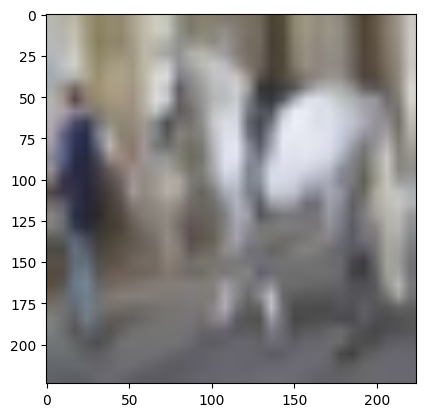

In [ ]:
plt.imshow(val_images[0])

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  
  # Get the pred label
  pred_label = get_pred_label(pred_prob)
  
  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)


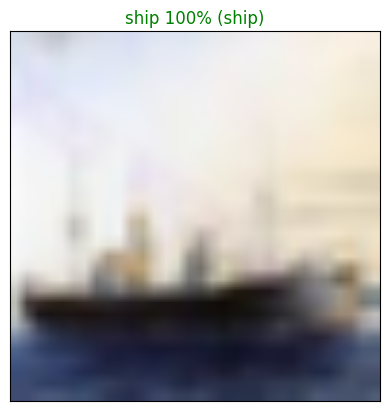

In [ ]:
# View an example prediction, original image and truth label
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images)

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with
  the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = cifar_labels[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)), 
                     top_10_pred_values, 
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

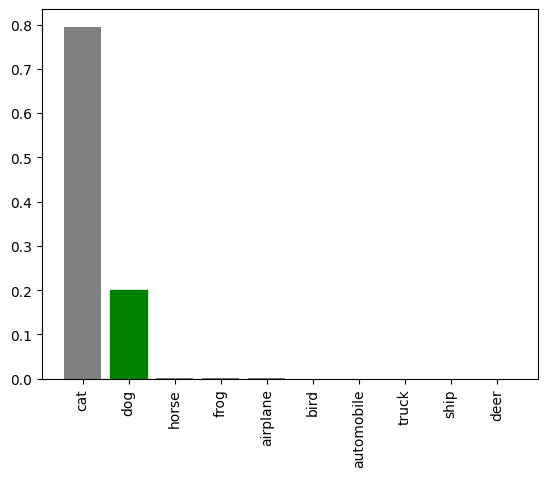

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)


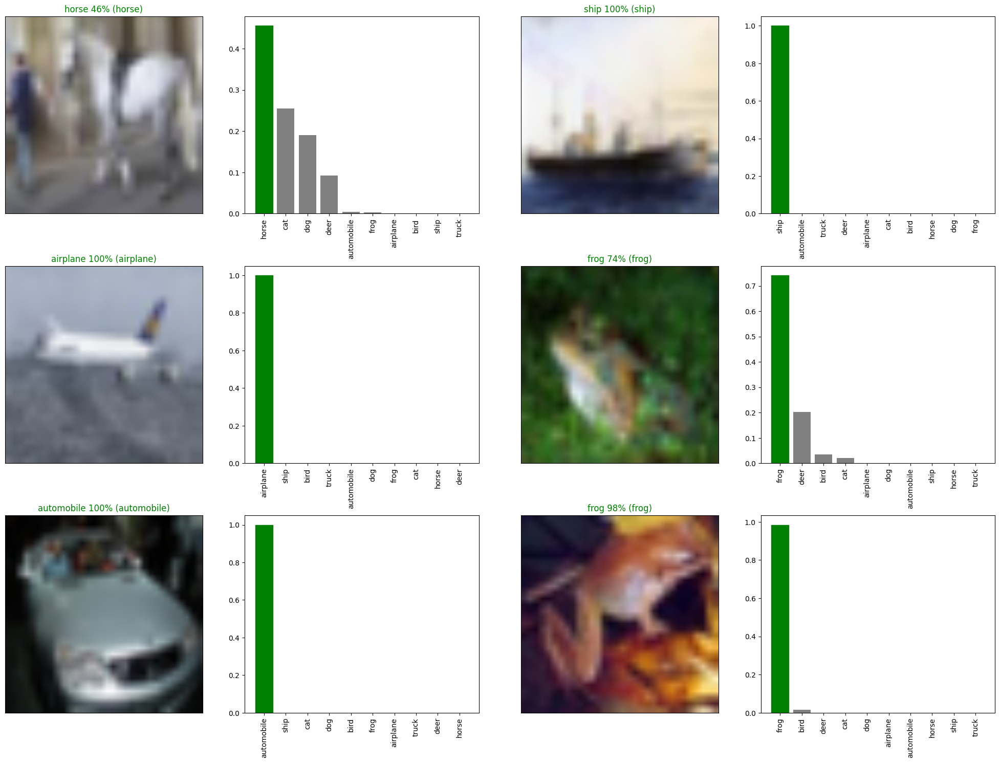

In [ ]:
# Let's check a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

In [ ]:
model2.evaluate(val_data)

313/313 [==============================] - 15s 46ms/step - loss: 0.4641 - accuracy: 0.8569


[0.46409815549850464, 0.8568999767303467]

## Preprocessing for files

In [173]:

# Define image size
IMG_SIZE = 224

def fprocess_image(image_path):
  """
  Takes an image file path and turns it into a Tensor.
  """
  # Read in image file
  # image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image_path, channels=3)
  # Convert the colour channel values from 0-225 values to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired size (224, 244)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
  return image

# Create a simple function to return a tuple (image, label)
def fget_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label).
  """
  image = fprocess_image(image_path)
  return image, label

# Define the batch size, 32 is a good default
BATCH_SIZE = 32

# Create a function to turn data into batches
def fcreate_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths
    data_batch = data.map(fprocess_image).batch(BATCH_SIZE)
    return data_batch
  
  # If the data if a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(fget_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    # If the data is a training dataset, we shuffle it
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                              tf.constant(y))) # labels
    
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(fget_image_label)

    # Turn the data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch




In [ ]:
cifar_labels

array(['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog',
       'horse', 'ship', 'truck'], dtype=object)

## TESTING ON CUSTOM DATA

In [119]:
tf.image.decode_jpeg(tf.io.read_file("/content/photo.jpg"),channels=3)

<tf.Tensor: shape=(480, 640, 3), dtype=uint8, numpy=
array([[[178, 191, 200],
        [177, 190, 199],
        [174, 188, 197],
        ...,
        [108, 134, 105],
        [103, 134, 102],
        [100, 134,  99]],

       [[177, 190, 199],
        [176, 189, 198],
        [175, 188, 197],
        ...,
        [106, 132, 105],
        [102, 131, 100],
        [ 98, 132,  99]],

       [[180, 190, 199],
        [177, 190, 198],
        [176, 189, 197],
        ...,
        [107, 131, 107],
        [104, 130, 103],
        [100, 131, 100]],

       ...,

       [[254, 254, 254],
        [254, 254, 254],
        [254, 254, 254],
        ...,
        [178, 162, 165],
        [180, 161, 165],
        [180, 161, 165]],

       [[254, 254, 254],
        [254, 254, 254],
        [254, 254, 254],
        ...,
        [177, 161, 162],
        [179, 160, 162],
        [179, 160, 162]],

       [[254, 254, 254],
        [254, 254, 254],
        [254, 254, 254],
        ...,
        [176, 160, 16

In [101]:
custom_image="/content/drive/MyDrive/Cifar10/test_data_custom/dog1.jpg"
custom_data = fcreate_data_batches(np.array(custom_image).reshape(1), test_data=True)

Creating test data batches...


In [152]:
np.array(custom_image).reshape(1).shape

(1,)

In [102]:
custom_preds=model4.predict(custom_data)

1/1 [==============================] - 1s 1s/step


In [103]:
custom_preds

array([[2.8807155e-03, 2.0152350e-01, 2.4563962e-04, 4.6939482e-03,
        6.9795139e-03, 5.8134419e-01, 3.2417063e-02, 4.6335354e-02,
        9.9798307e-02, 2.3781775e-02]], dtype=float32)

In [106]:
custom_image

'/content/drive/MyDrive/Cifar10/test_data_custom/dog1.jpg'

In [104]:
np.argmax(custom_preds)

5

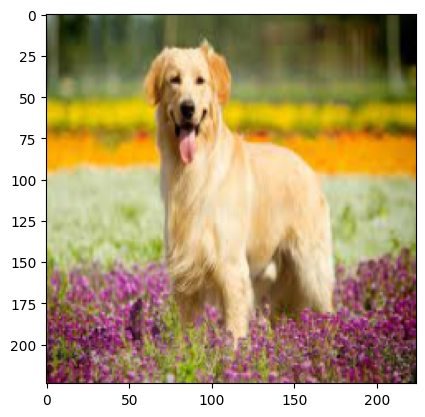

In [109]:
plt.imshow(fprocess_image(custom_image))

## TAKING LIVE PHOTO AND TESTING IT ON THE IMAGES

In [190]:
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode

def take_photo(filename='photo.jpg', quality=0.8):
  js = Javascript('''
    async function takePhoto(quality) {
      const div = document.createElement('div');
      const capture = document.createElement('button');
      capture.textContent = 'Capture';
      div.appendChild(capture);

      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});

      document.body.appendChild(div);
      div.appendChild(video);
      video.srcObject = stream;
      await video.play();

      // Resize the output to fit the video element.
      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      // Wait for Capture to be clicked.
      await new Promise((resolve) => capture.onclick = resolve);

      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();
      div.remove();
      return canvas.toDataURL('image/jpeg', quality);
    }
    ''')
  display(js)
  data = eval_js('takePhoto({})'.format(quality))
  binary = b64decode(data.split(',')[1])
  test=tf.constant(binary)
  final=fcreate_data_batches(np.array(test).reshape(1),test_data=True)
  plt.imshow(tf.image.decode_jpeg(test))
  preds=model4.predict(final)
  plt.axis("off")
  plt.title(cifar_labels[np.argmax(preds)])

  return 0

In [163]:
type(tf.io.read_file("/content/photo.jpg"))

tensorflow.python.framework.ops.EagerTensor

<IPython.core.display.Javascript object>

Creating test data batches...
1/1 [==============================] - 0s 44ms/step


0

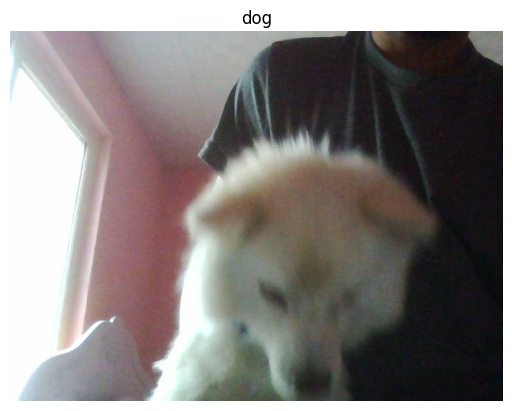

In [191]:
take_photo()

In [193]:
cifar_labels

array(['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog',
       'horse', 'ship', 'truck'], dtype=object)

<IPython.core.display.Javascript object>

Creating test data batches...
1/1 [==============================] - 0s 31ms/step


0

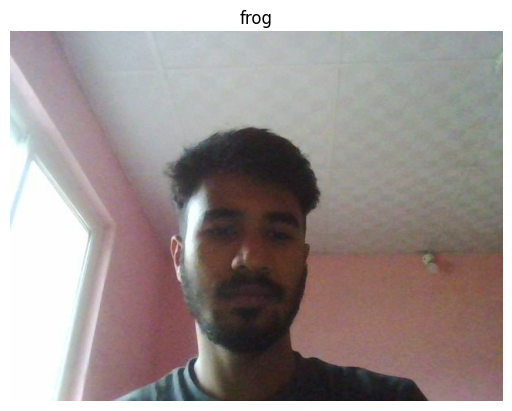

In [192]:
take_photo()

In [115]:
from IPython.display import Image
try:
  filename = take_photo()
  print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

<IPython.core.display.Javascript object>

Creating training data batches...
Attempt to convert a value (None) with an unsupported type (<class 'NoneType'>) to a Tensor.


In [ ]:
cifar_labels

array(['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog',
       'horse', 'ship', 'truck'], dtype=object)

#IMAGE DATA GENERATOR

In [65]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
train_datagen = ImageDataGenerator(rescale=1./255)
train_datagen


In [74]:
(xx_train, yy_train), (xx_test, yy_test) =keras.datasets.cifar10.load_data()